# Емельянов Алексей Алексеевич

Определение типа транспорта, 

датасет - https://www.kaggle.com/datasets/yusufberksardoan/traffic-detection-project?resource=download
модель - 

# Импорты

In [3]:
# pyenv local 3.10.0,  pyenv global 3.10.11
# label-studio


# массивы, рандом
import pandas as pd
import numpy as np

# файлы
from os.path import join as pjoin
import os
import json

# модельки
import segmentation_models_pytorch as smp

# torch
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset

# аугментация
import albumentations as album

# отображение
from tqdm.notebook import tqdm
import cv2
import matplotlib.pyplot as plt
import torchvision
import torchinfo
from torch.utils.tensorboard import SummaryWriter
from module.board import uniqufy_path, create_image_plot

# метрики
from torchmetrics.classification import BinaryJaccardIndex

# оптимизаторы, изменение lr
from torch.optim.lr_scheduler import ReduceLROnPlateau, CosineAnnealingWarmRestarts

# лос
from segmentation_models_pytorch.losses import DiceLoss

C:\Users\emely\AppData\Local\Temp\ipykernel_15324\1693809983.py:6: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd
c:\Users\emely\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Константы

In [2]:
DATA_DIR = './../data/data/'
SIZE_IMAGE = 256
BATCH_SIZE = 32
NUM_WORKERS = 0
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

NameError: name 'torch' is not defined

In [1]:
x_train_dir = os.path.join(DATA_DIR, 'train/images')
y_train_dir = os.path.join(DATA_DIR, 'train/labels')

x_valid_dir = os.path.join(DATA_DIR, 'valid/images')
y_valid_dir = os.path.join(DATA_DIR, 'valid/labels')

x_test_dir = os.path.join(DATA_DIR, 'test/images')
y_test_dir = os.path.join(DATA_DIR, 'test/labels')


NameError: name 'os' is not defined

In [17]:
os.listdir(x_train_dir)

['aguanambi-1000_png_jpg.rf.0ab6f274892b9b370e6441886b2d7b9d.jpg',
 'aguanambi-1000_png_jpg.rf.dc59d3c5df5d991c1475e5957ea9948c.jpg',
 'aguanambi-1000_png_jpg.rf.f425c626b206bb27a1b73fa7e38d6361.jpg',
 'aguanambi-1085_png_jpg.rf.60d1095729839f1644f21e2a31e55cec.jpg',
 'aguanambi-1085_png_jpg.rf.9560a8e9822039cd2b4566dd71f288a7.jpg',
 'aguanambi-1085_png_jpg.rf.ba8bcc4fd6c7cae9f610e611e300bdf1.jpg',
 'aguanambi-1090_png_jpg.rf.6bc72d297979796c1a87ba754fec824c.jpg',
 'aguanambi-1090_png_jpg.rf.906544c343fd56ec0ed1ed1f48e8e7c2.jpg',
 'aguanambi-1090_png_jpg.rf.da8757883707a0aba29fb71deb2f8872.jpg',
 'aguanambi-1100_png_jpg.rf.09650bd053f33e6057e6e1840ca909f9.jpg',
 'aguanambi-1100_png_jpg.rf.4cb9aaea57075d665b72dd30eda9aa06.jpg',
 'aguanambi-1100_png_jpg.rf.d80a5e24fefe8ec0b7f3eab360ef4424.jpg',
 'aguanambi-1110_png_jpg.rf.9439331a624f8afc4871caf0ffe8f7cc.jpg',
 'aguanambi-1110_png_jpg.rf.944e2d609db4f393bd4dce0f40acafc8.jpg',
 'aguanambi-1110_png_jpg.rf.aca9432a9bcd0ef761dcb9b9b7e4d130.j

----------------------------------

In [66]:
import torch
import torchvision
from torchvision import utils
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.transforms import transforms as T
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import math


In [67]:
num_classes = 5
label_classes = ['bicycle', 'bus', 'car', 'motorbike', 'person']

In [111]:
# Определение класса для датасета
class Dataset(Dataset):
    def __init__(self, data_dir, typeData='train', transforms=None):
        self.data_dir = data_dir
        self.transforms = transforms
        self.images_dir = os.path.join(data_dir, typeData, 'images')
        self.labels_dir = os.path.join(data_dir, typeData, 'labels')
        self.image_paths = os.listdir(self.images_dir)
        # -------
        self.image_paths = self.image_paths[:6]

    def __getitem__(self, idx):
        img_name = self.image_paths[idx]
        img_path = os.path.join(self.images_dir, img_name)
        label_path = os.path.join(self.labels_dir, img_name.replace('.jpg', '.txt'))

        image = Image.open(img_path).convert("RGB")
        boxes = []
        labels = []

        with open(label_path, 'r') as file:
            lines = file.readlines()
            for line in lines:
                class_id, x_center, y_center, width, height = map(float, line.strip().split())
                xmin = (x_center - width / 2) * image.width
                ymin = (y_center - height / 2) * image.height
                xmax = (x_center + width / 2) * image.width
                ymax = (y_center + height / 2) * image.height
                boxes.append([xmin, ymin, xmax, ymax])
                labels.append(class_id)

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels

        if self.transforms is not None:
            image, target = self.transforms(image, target)
        return image, target

    def __len__(self):
        return len(self.image_paths)
    
def my_collate_fn(batch):
    images = []
    targets = []
    for image, target in batch:
        images.append(image)
        targets.append(target)
    return images, targets

def print_example(data_loader, num_batches=1, num_columns=3):
    count = 0
    for images, targets in data_loader:
        for i in range(len(images)):
            if count >= num_batches:
                return
            if count % num_columns == 0:
                fig, axes = plt.subplots(1, num_columns, figsize=(15, 5))  # Создаем новый ряд

            image = images[i]
            target = targets[i]

            # Преобразуем изображение в тензор и изменяем порядок размерностей
            image = transforms.ToTensor()(image)
            image = image.permute(1, 2, 0)

            ax = axes[count % num_columns]  # Получаем текущий subplot
            ax.imshow(image)

            # Рисуем прямоугольники (боксы) на изображении
            for box, label in zip(target["boxes"], target["labels"]):
                xmin, ymin, xmax, ymax = box
                width = xmax - xmin
                height = ymax - ymin
                rect = patches.Rectangle((xmin, ymin), width, height, linewidth=1, edgecolor='r', facecolor='none')
                ax.add_patch(rect)

                # Добавляем текст с меткой класса рядом с боксом
                ax.text(xmin, ymin, f'{label_classes[label.item()]}', fontsize=8, color='b', verticalalignment='top')

            count += 1
            if count % num_columns == 0 or count == num_batches:
                plt.tight_layout()  # Выравниваем подписи
                plt.show()

In [112]:
dataset_train = Dataset(DATA_DIR, typeData='train')
dataset_test = Dataset(DATA_DIR, typeData='test')
dataset_valid = Dataset(DATA_DIR, typeData='valid')
data_loader_train = DataLoader(dataset_train, batch_size=2, shuffle=True, collate_fn=my_collate_fn)
data_loader_test = DataLoader(dataset_test, batch_size=2, shuffle=True, collate_fn=my_collate_fn)
data_loader_valid = DataLoader(dataset_valid, batch_size=2, shuffle=True, collate_fn=my_collate_fn)

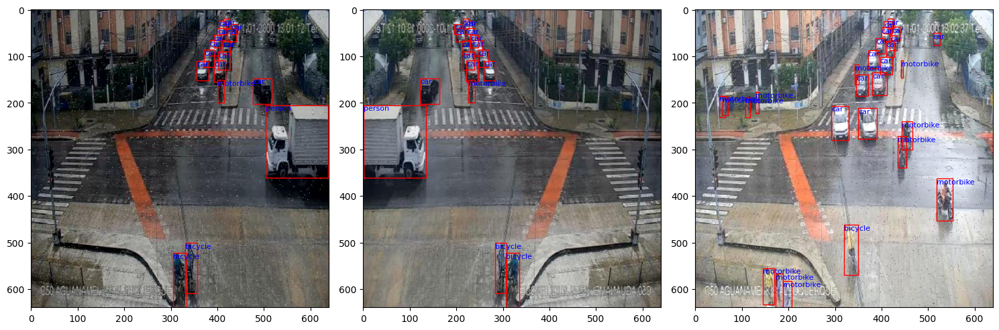

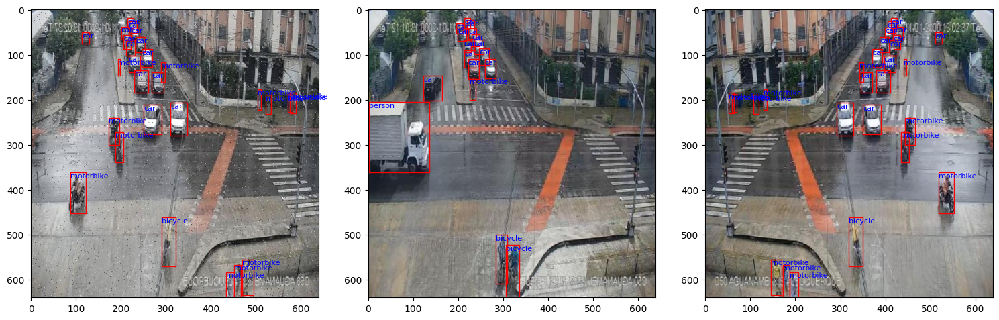

In [114]:
print_example(data_loader_train, num_batches=6, num_columns=3)

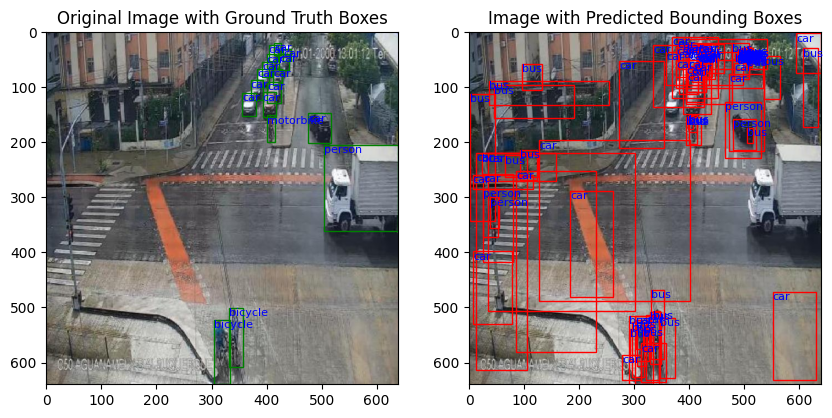

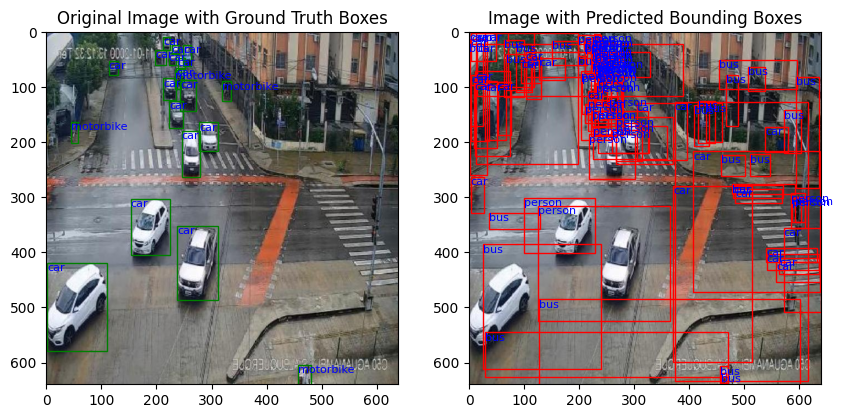

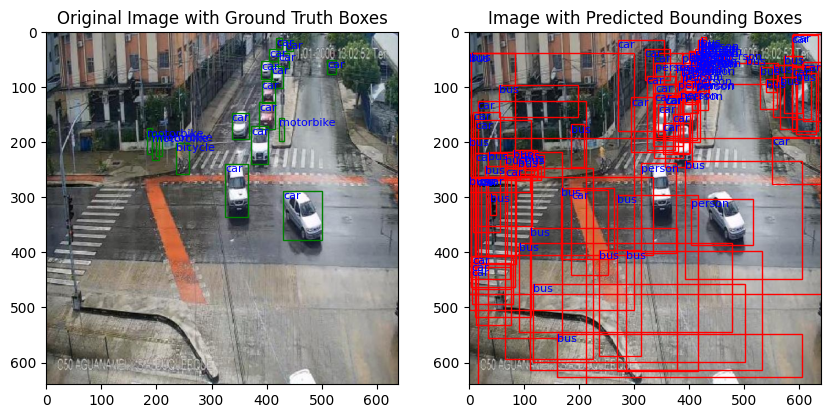

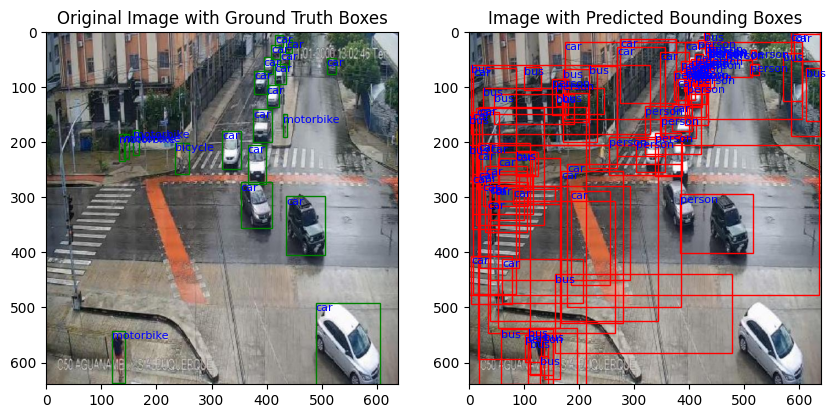

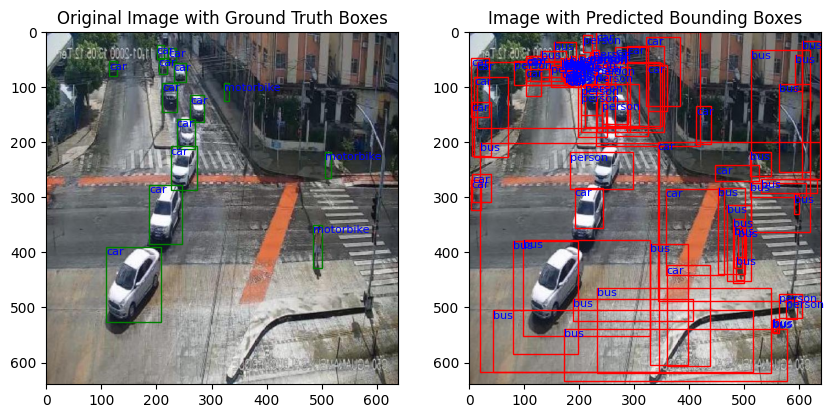

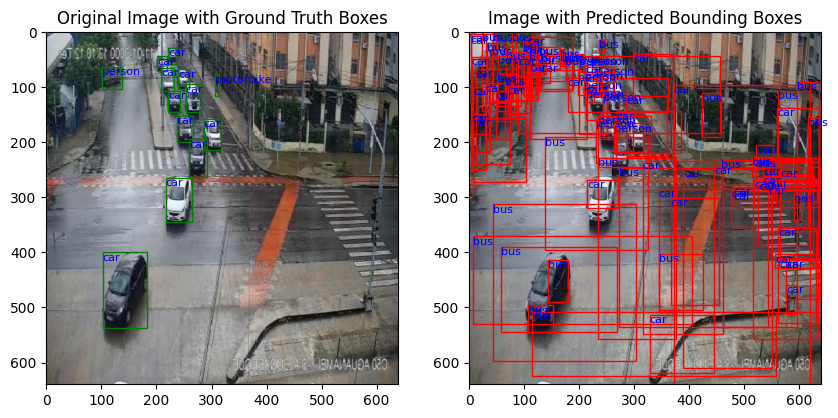

Accuracy of bounding boxes: 33.98%


In [115]:
import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as F
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def infer_and_evaluate(model, data_loader):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    model.eval()
    total_boxes = 0
    correct_boxes = 0

    with torch.no_grad():
        for images, targets in data_loader:
            images = [F.to_tensor(image).to(device) for image in images]
            targets = [{k: v.to(device) for k, v in target.items()} for target in targets]

            predictions = model(images)

            for image, preds, target in zip(images, predictions, targets):
                total_boxes += len(target['boxes'])

                # Plot both images side by side
                fig, axes = plt.subplots(1, 2, figsize=(10, 5))

                # Plot original image with ground truth bounding boxes
                axes[0].imshow(F.to_pil_image(image.cpu()))
                axes[0].set_title('Original Image with Ground Truth Boxes')

                for box_true, label_true in zip(target['boxes'], target['labels']):
                    box_true = box_true.cpu().tolist()
                    xmin, ymin, xmax, ymax = box_true
                    width = xmax - xmin
                    height = ymax - ymin
                    rect = patches.Rectangle((xmin, ymin), width, height, linewidth=1, edgecolor='g', facecolor='none')
                    axes[0].add_patch(rect)

                    # Add text label
                    label_name = label_classes[label_true.item()]
                    axes[0].text(xmin, ymin, label_name, fontsize=8, color='b', verticalalignment='top')

                # Plot image with predicted bounding boxes
                axes[1].imshow(F.to_pil_image(image.cpu()))

                for box_pred, label_pred in zip(preds['boxes'], preds['labels']):
                    box_pred = box_pred.cpu().tolist()
                    xmin, ymin, xmax, ymax = box_pred
                    width = xmax - xmin
                    height = ymax - ymin
                    rect = patches.Rectangle((xmin, ymin), width, height, linewidth=1, edgecolor='r', facecolor='none')
                    axes[1].add_patch(rect)

                    # Add text label
                    label_name = label_classes[label_pred.item()]
                    axes[1].text(xmin, ymin, label_name, fontsize=8, color='b', verticalalignment='top')

                axes[1].set_title('Image with Predicted Bounding Boxes')
                plt.show()

                # Calculate accuracy
                for box_pred in preds['boxes']:
                    for box_true in target['boxes']:
                        iou = torchvision.ops.box_iou(box_pred.unsqueeze(0), box_true.unsqueeze(0)).item()
                        if iou > 0.5:
                            correct_boxes += 1
                            break

    accuracy = correct_boxes / total_boxes if total_boxes > 0 else 0
    print(f"Accuracy of bounding boxes: {accuracy * 100:.2f}%")

model = fasterrcnn_resnet50_fpn(pretrained=True)

num_classes = len(label_classes)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

infer_and_evaluate(model, data_loader_test)


топ

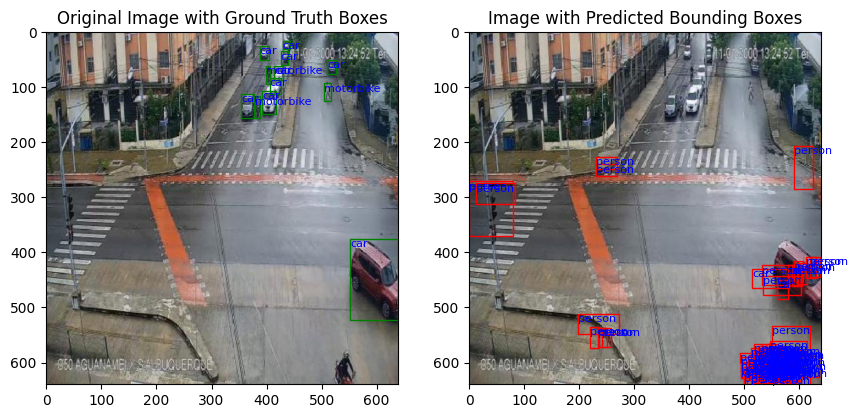

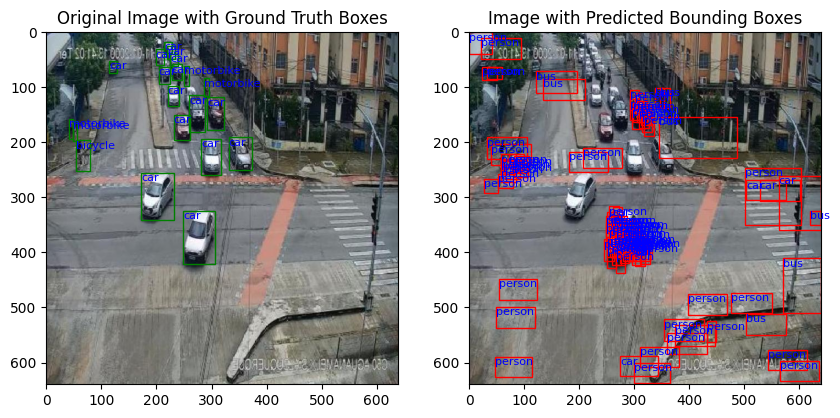

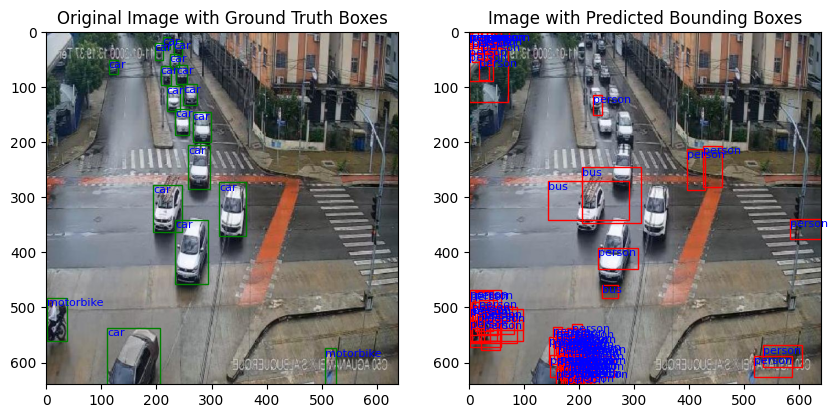

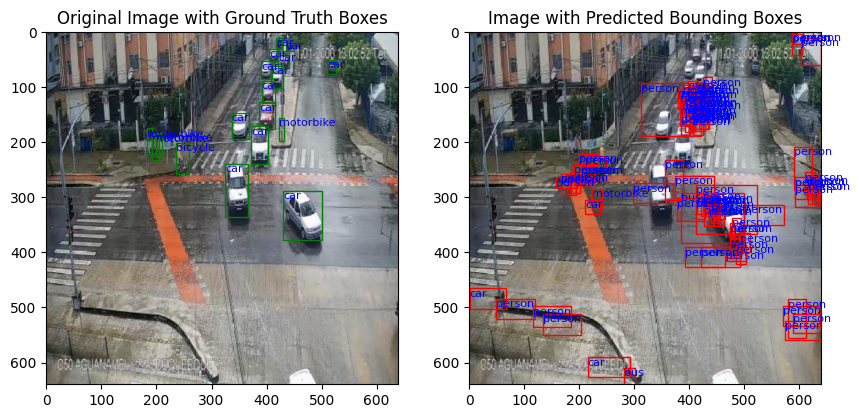

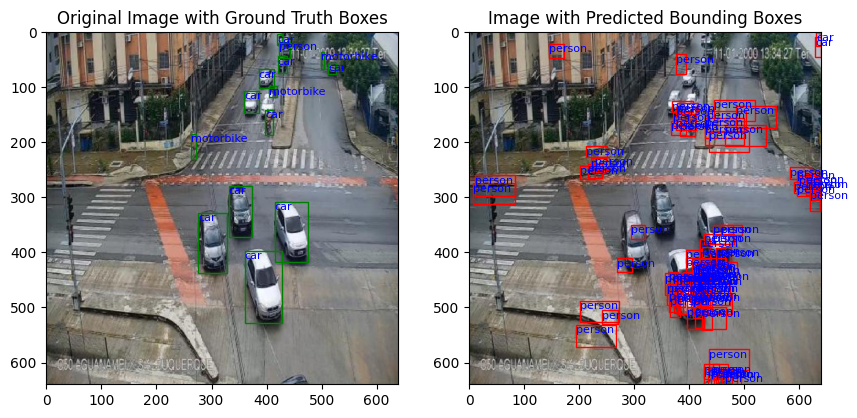

...

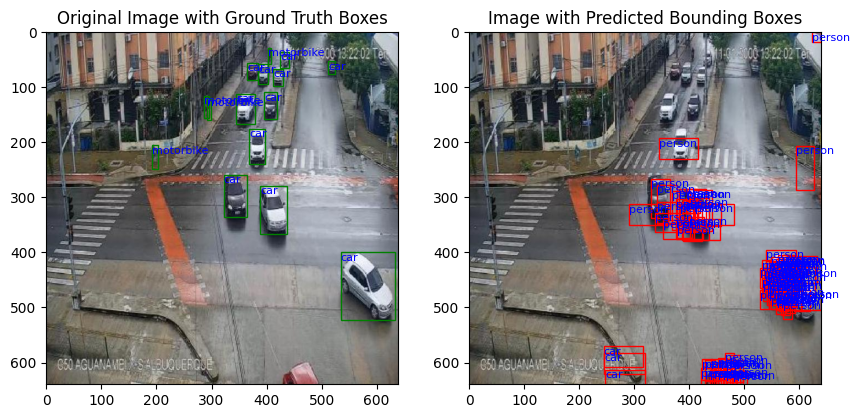

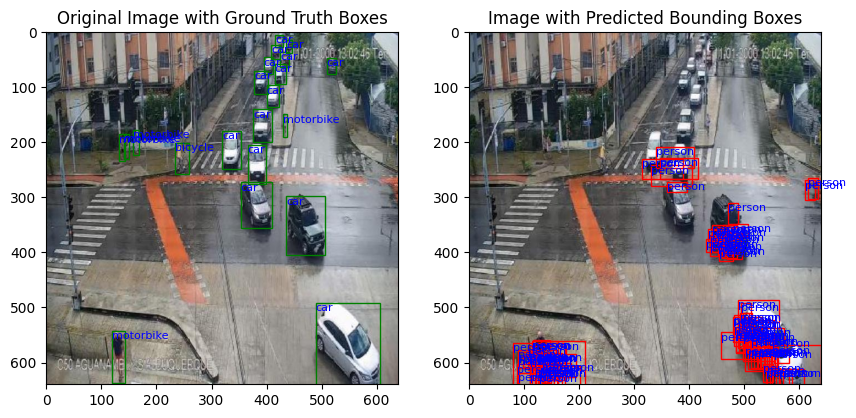

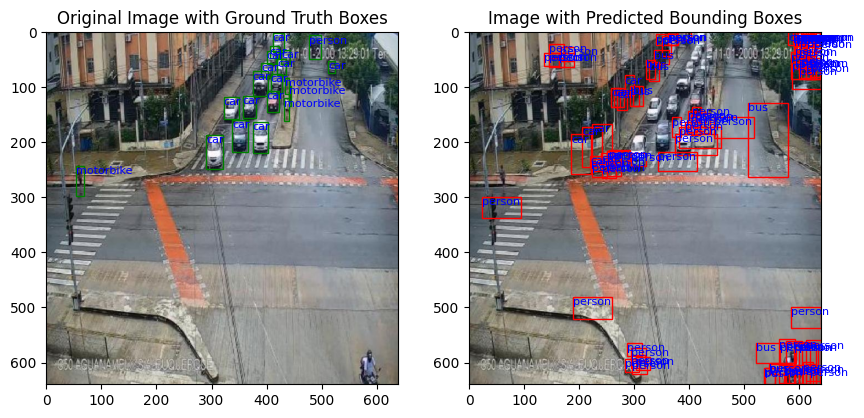

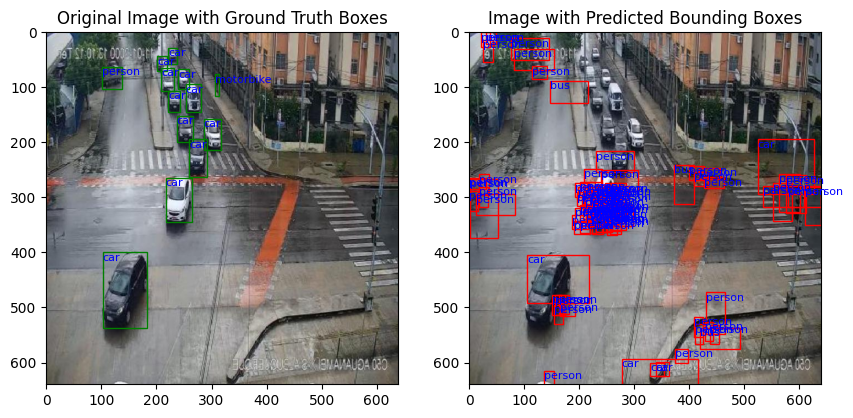

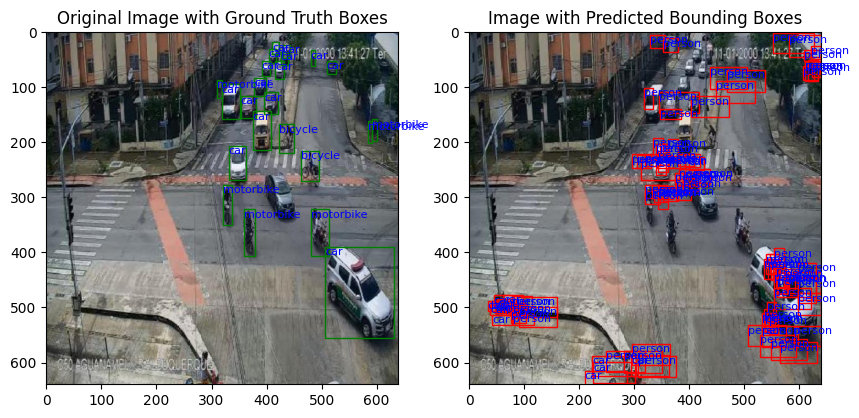

Accuracy of bounding boxes: 2.78%


In [109]:
import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as F
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone

def infer_and_evaluate(model, data_loader):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    model.eval()
    total_boxes = 0
    correct_boxes = 0

    with torch.no_grad():
        for images, targets in data_loader:
            images = [F.to_tensor(image).to(device) for image in images]
            targets = [{k: v.to(device) for k, v in target.items()} for target in targets]

            predictions = model(images)

            for image, preds, target in zip(images, predictions, targets):
                total_boxes += len(target['boxes'])

                # Plot both images side by side
                fig, axes = plt.subplots(1, 2, figsize=(10, 5))

                # Plot original image with ground truth bounding boxes
                axes[0].imshow(F.to_pil_image(image.cpu()))
                axes[0].set_title('Original Image with Ground Truth Boxes')

                for box_true, label_true in zip(target['boxes'], target['labels']):
                    box_true = box_true.cpu().tolist()
                    xmin, ymin, xmax, ymax = box_true
                    width = xmax - xmin
                    height = ymax - ymin
                    rect = patches.Rectangle((xmin, ymin), width, height, linewidth=1, edgecolor='g', facecolor='none')
                    axes[0].add_patch(rect)

                    # Add text label
                    label_name = label_classes[label_true.item()]
                    axes[0].text(xmin, ymin, label_name, fontsize=8, color='b', verticalalignment='top')

                # Plot image with predicted bounding boxes
                axes[1].imshow(F.to_pil_image(image.cpu()))

                for box_pred, label_pred in zip(preds['boxes'], preds['labels']):
                    box_pred = box_pred.cpu().tolist()
                    xmin, ymin, xmax, ymax = box_pred
                    width = xmax - xmin
                    height = ymax - ymin
                    rect = patches.Rectangle((xmin, ymin), width, height, linewidth=1, edgecolor='r', facecolor='none')
                    axes[1].add_patch(rect)

                    label_name = label_classes[label_pred.item()]
                    axes[1].text(xmin, ymin, label_name, fontsize=8, color='b', verticalalignment='top')

                axes[1].set_title('Image with Predicted Bounding Boxes')
                plt.show()

                # Calculate accuracy
                for box_pred in preds['boxes']:
                    for box_true in target['boxes']:
                        iou = torchvision.ops.box_iou(box_pred.unsqueeze(0), box_true.unsqueeze(0)).item()
                        if iou > 0.5:
                            correct_boxes += 1
                            break

    accuracy = correct_boxes / total_boxes if total_boxes > 0 else 0
    print(f"Accuracy of bounding boxes: {accuracy * 100:.2f}%")
   

def modify_fasterrcnn_resnet50_fpn(num_classes):
    backbone = resnet_fpn_backbone('resnet50', pretrained=True)
    model = FasterRCNN(backbone, num_classes=num_classes)
    return model

model = modify_fasterrcnn_resnet50_fpn(num_classes)

# model = fasterrcnn_resnet50_fpn(pretrained=True, num_classes=num_classes)

infer_and_evaluate(model, data_loader_test)

AttributeError: 'Image' object has no attribute 'to'

In [74]:
def get_model(num_classes):
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    # Замена последнего слоя классификатора на новый слой с num_classes классами
    num_classes = num_classes + 1  # 1 (background) + number of classes
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)
    return model

# Инициализация модели и параметров обучения
model = get_model(num_classes)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

c:\Users\emely\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\emely\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [78]:

num_epochs = 10
for epoch in range(num_epochs):
    for images, targets in data_loader_train:
        # Переносим данные на устройство (GPU, если доступно)
        images = [transforms.ToTensor()(image).to(DEVICE) for image in images]
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        optimizer.zero_grad()
        # Прямой проход
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        # Обратное распространение и оптимизация
        losses.backward()
        optimizer.step()
    lr_scheduler.step()
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {losses.item()}")
torch.save(model.state_dict(), 'faster_rcnn_model.pth')

RuntimeError: Input type (torch.cuda.FloatTensor) and weight type (torch.FloatTensor) should be the same